# Description
***
This notebook contains reasearch for identifying image-based codes (ArUco codes) to estimate the position and rotation of a camera relative to an object.
***
ArUco codes are well-developed fiducial markers with native OpenCV compatability (though the cv2.aruco library). Aruco markers were selected over QR-based alternatives due to their increased robustness and reliablility.
This findings in this script will be used to find a global registration 'guess' to align point clouds caputred with TrueDepth sensors to CAD-generated ground truth data. This information will be used to build a training database for a depth completion network.
### Guides
The below guides provide a solid foundation for understanding how fiducial markers work, the advantage of using them, and code-level implimentations:
1. [AprilTag with Python](https://pyimagesearch.com/2020/11/02/apriltag-with-python/)
2. [Generating ArUco markers with OpenCV and Python](https://pyimagesearch.com/2020/12/14/generating-aruco-markers-with-opencv-and-python/)
3. [Detecting ArUco markers with OpenCV and Python](https://pyimagesearch.com/2020/12/21/detecting-aruco-markers-with-opencv-and-python/)
4. [Determining ArUco marker type with OpenCV and Python](https://pyimagesearch.com/2020/12/28/determining-aruco-marker-type-with-opencv-and-python/)



In [15]:
## Import packages
import os
import numpy as np
os.environ["OPENCV_IO_ENABLE_OPENEXR"]="1"
import cv2 as cv
import matplotlib.pyplot as plt
from glob import glob
from stl import mesh
import csv

## Camera Calibration
The below code is a simple chessboard camera calibration, which may be used if camera intrinsic properties are not available. This example was pulled directly from the [OpenCV documentation](https://docs.opencv.org/4.x/dc/dbb/tutorial_py_calibration.html).

In [16]:
def calibrateCameraFromChessboardImages(image_paths, gridSize=(8,6), squareSizeMM=25):

    # termination criteria
    criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)

    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((gridSize[0]*gridSize[1],3), np.float32)
    objp[:,:2] = np.mgrid[0:gridSize[0],0:gridSize[1]].T.reshape(-1,2) * squareSizeMM

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d point in real world space
    imgpoints = [] # 2d points in image plane.

    for fname in image_paths:
        img = cv.imread(fname)
        gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

        # Find the chess board corners
        ret, chess_corners = cv.findChessboardCorners(gray, gridSize, None)
        
        # If found, add object points, image points (after refining them)
        if ret == True:
            objpoints.append(objp)
            corners2 = cv.cornerSubPix(gray,chess_corners, (11,11), (-1,-1), criteria)
            imgpoints.append(corners2)
            # Draw and display the corners
            cv.drawChessboardCorners(img, gridSize, corners2, ret)
            plt.imshow(img)
            plt.axis('off')
            plt.show()

    # Calibrate the camera based on the found object points
    ret, mtx, dist, rvecs, tvecs = cv.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

    ## Undistort an input image
    img = cv.imread(r'Camera Calibration Images/1.png')
    h,  w = img.shape[:2]
    newcameramtx, roi = cv.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))

    # Undistort
    dst = cv.undistort(img, mtx, dist, None, newcameramtx)

    # Crop the image
    x, y, w, h = roi
    dst = dst[y:y+h, x:x+w]
    plt.imshow(dst)
    plt.title("Undistorted Image")
    plt.show()

    ## Find the reprojection error
    mean_error = 0
    for i in range(len(objpoints)):
        imgpoints2, _ = cv.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
        error = cv.norm(imgpoints[i], imgpoints2, cv.NORM_L2)/len(imgpoints2)
        mean_error += error
    print( "total error: {}".format(mean_error/len(objpoints)) )

    return mtx, dst

## Image Rectification
This step corrects for lens distortion in RGB Images by applying Apple-provided lensDistortionLookupTable values to radially distort images. 

In [17]:
class Point:
    def __init__(self, x, y) -> None:
        self.x = x
        self.y = y

class Size: 
    def __init__(self, width, height) -> None:
        self.width = width
        self.height = height

def rectifyPoint(point: Point, lookupTable: np.ndarray, opticalCenter: Point, imageSize: Size):
    
    # Determine the maximum radius 
    delta_ocx_max = max(opticalCenter.x, imageSize.width - opticalCenter.x)
    delta_ocy_max = max(opticalCenter.y, imageSize.height - opticalCenter.y)
    r_max = np.sqrt( delta_ocx_max**2 + delta_ocy_max**2 )

    # Determine the vector from the opical center to the given point
    v_point_x = point.x - opticalCenter.x
    v_point_y = point.y - opticalCenter.y

    # Determine the radius at the point
    r_point = np.sqrt( v_point_x**2 + v_point_y**2)

    # Look up the relative radial magnification to apply in the provided lookup table
    lookupTableCount = lookupTable.shape[0]

    # Linear interpolation
    if r_point < r_max: 
        val = r_point * (lookupTableCount - 1) / r_max
        idx = int(val)
        frac = val - idx

        mag_1 = lookupTable[idx]
        mag_2 = lookupTable[idx + 1]

        magnification = (1 - frac)*mag_1 + frac*mag_2
    
    else:
        magnification = lookupTable[lookupTableCount-1]

    # Apply radial magnification
    new_v_point_x = v_point_x + magnification*v_point_x
    new_v_point_y = v_point_y + magnification*v_point_y

    return Point(opticalCenter.x + new_v_point_x, opticalCenter.y + new_v_point_y)

def undistortImage(image: np.ndarray, lensDistortionLookupTable: np.ndarray, distortionCenter: Point):
    
    # Get image parameters
    width = image.shape[1]
    height = image.shape[0]
    print(f"{width}, {height}")
    imageSize = Size(width, height)

    # Ensure image properties are correct relative to the orientation of the image
    if width > height:
        opticalCenter = Point(distortionCenter.x, distortionCenter.y)
    else:
        opticalCenter = Point(distortionCenter.y, distortionCenter.x)

    # Save the transformed positions of all of the x and y points
    xpoints = np.empty((height,width), dtype=np.float32)
    ypoints = np.empty((height,width), dtype=np.float32)

    for y in range(height):
        for x in range(width): 
            inputPoint = Point(x, y)
            transformedPoint = rectifyPoint(inputPoint, lensDistortionLookupTable, opticalCenter, imageSize)
            xpoints[y,x] = transformedPoint.x
            ypoints[y,x] = transformedPoint.y

    # Map the image to the rectified image space
    return cv.remap(image, xpoints, ypoints, cv.INTER_LANCZOS4)


## Generate ArUco Codes
ArUco codes are recognized using a variation of a qr-code like matrix. There are several ArUco code formats for different use cases as described in the [OpenCV documentation of ArUco](https://docs.opencv.org/4.x/d5/dae/tutorial_aruco_detection.html).

In [18]:
def generateArUcoMarkers(numberOfGeneratedTags, arUcoDictionary, markerSize=6, outputdir='ArUco Markers'):

    output_paths = []

    # Draw the markers
    for i in range(numberOfGeneratedTags):
        
        # Generate the tag
        tag = cv.aruco.generateImageMarker(
            dictionary=arUcoDictionary, 
            id=i,  
            sidePixels=markerSize, 
            borderBits=1)
        
        # Plot the tags
        # plt.imshow(tag, cmap='gray')
        # plt.axis('off')
        # plt.show()

        # Save the tags
        output_path = os.path.join(outputdir, 'marker_' + str(i).zfill(2) + '.png')
        output_paths.append(output_path)
        cv.imwrite(output_path, tag)

    return output_paths

## Convert ArUco Tag Images to 3D Models for Manufacturing
The board used to build the depth completion dataset will feature embedded 3D printed ArUco codes for camera position identification. 3D prints are used (instead of printed-out codes) to increase the precision of the ArUco code fits relative to the CNC'd base plate. 
<br>
<br>
The 3D model algorithum, below, is very simple in construction; it simply extrudes a voxel for every image pixel. Consiquently, it is important that the images passed into the `create_3d_model` function are **as low resolution as possible, without loosing details**. For instance, an ArUco code from the 4x4 library needs a 6x6 pixel grid to construct the code, or an image with dimension (6,6). 
<br>
<br>
Two 3D models are output from the `create_3d_model` function, one with the suffix 'black' and the other 'white'. These seperate files contain the geometry that will need to be printed in each respective filamint colour. 

In [19]:
## This function initalizes a gridboard for 3D printer manufacturing. This code differs from the default 
## implimentation by asserting that the size of and length between markers evenly divides into the gridboard image
## resolution (to improve 3D print quality, which is based on the image)

def generateGridboardFor3DPrinting():
    
    dictionary = cv.aruco.getPredefinedDictionary(cv.aruco.DICT_4X4_50)

    # Define the shape of the grid (3D PRINT SETTINGS)
    worldGridSize = 0.2         # size in meters
    numberOfTags = 3            # the gridboard will be NxN in shape
    markerLength = 0.024        # size in meters

    # Find the number of pixels required in the output image
    # To reduce the amount of geometry in the exported stl, exactly 6x6 pixels are to be used to create ArUco tags
    pixelWidth = markerLength/6
    boardPixelWidth = worldGridSize/pixelWidth
    if not boardPixelWidth.is_integer(): 
        print(f"The markerLength and worldGridSize do not produce an integer number of boardPixels: {boardPixelWidth}")
        print("Select better markerLength and worldGridSize values for improved geometric accuracy")
    else:
        boardPixelWidth = int(boardPixelWidth)

    # Calculate the grid parameters
    gridSize = (numberOfTags, numberOfTags)
    markerSeperation =  (worldGridSize-markerLength*numberOfTags)/(numberOfTags-1) # seperation in meters
    gridIds = np.linspace(0, numberOfTags**2-1, numberOfTags**2)

    # Output grid parameters
    print(" ")
    print("GRID PARAMETERS")
    print("Grid size: {} m".format(worldGridSize))
    print("Numer of markers: {}".format(numberOfTags))
    print("Marker seperation: {}".format(markerSeperation))
    print("Grid Ids: {}".format(gridIds))
    print(" ")

    # Initalize the Grid
    grid = cv.aruco.GridBoard(gridSize, markerLength, markerSeperation, dictionary, gridIds)

    # Display the grid
    gridImageSize = boardPixelWidth
    gridImage = np.zeros((gridImageSize,gridImageSize), dtype=np.uint8)
    gridImage = grid.generateImage((gridImageSize,gridImageSize), gridImage, 0, 1)

    # Save the image
    boardImagePath = 'ArUco Markers/testBoard.png'
    cv.imwrite(boardImagePath, gridImage)

    return grid

In [20]:
## This script creates 3D models from ArUco images. Ensure the ArUco images are 6px by 6px to reduce redundant geometry. 

def create_3d_model(image_path, output_path, target_width=60.0, height=1.0):
    
    # Read the ArUco marker image
    image = cv.imread(image_path, cv.IMREAD_GRAYSCALE)
    rows, cols = image.shape

    # Calculate scaling factor to achieve the target width
    scale_factor = target_width / cols

    # Prepare arrays to hold the vectors for the meshes
    black_vectors = []
    white_vectors = []

    # Iterate over each pixel
    for i in range(rows):
        for j in range(cols):
            color = image[i, j]

            # Define vertices for the cube
            vertices = np.array([
                [j * scale_factor, i * scale_factor, 0],
                [(j + 1) * scale_factor, i * scale_factor, 0],
                [(j + 1) * scale_factor, (i + 1) * scale_factor, 0],
                [j * scale_factor, (i + 1) * scale_factor, 0],
                [j * scale_factor, i * scale_factor, height],
                [(j + 1) * scale_factor, i * scale_factor, height],
                [(j + 1) * scale_factor, (i + 1) * scale_factor, height],
                [j * scale_factor, (i + 1) * scale_factor, height]
            ])

            # Define the 12 triangles composing the cube
            faces = np.array([
                [0, 3, 1],
                [1, 3, 2],
                [0, 4, 7],
                [0, 7, 3],
                [4, 5, 6],
                [4, 6, 7],
                [5, 1, 2],
                [5, 2, 6],
                [2, 3, 6],
                [3, 7, 6],
                [0, 1, 5],
                [0, 5, 4]
            ])

            # Assign to black or white vectors
            if color < 128:  # Black region
                for f in faces:
                    black_vectors.append(vertices[f])
            else:  # White region
                for f in faces:
                    white_vectors.append(vertices[f])

    # Convert to numpy arrays
    black_vectors = np.array(black_vectors)
    white_vectors = np.array(white_vectors)

    # Create meshes
    black_mesh = mesh.Mesh(np.zeros(black_vectors.shape[0], dtype=mesh.Mesh.dtype))
    white_mesh = mesh.Mesh(np.zeros(white_vectors.shape[0], dtype=mesh.Mesh.dtype))

    for i, vector in enumerate(black_vectors):
        black_mesh.vectors[i] = vector

    for i, vector in enumerate(white_vectors):
        white_mesh.vectors[i] = vector

    # Save the meshes as STL files
    save_folder = os.path.split(image_path)[0]
    black_mesh.save(os.path.join(save_folder, f'{output_path}_black.stl'))
    white_mesh.save(os.path.join(save_folder, f'{output_path}_white.stl'))

## Detecting ArUco Codes
This script simply detects ArUco markers using the `detectMarkers` method, then animates the reuslts. 

In [21]:
def detectArUcoMarkersAndAnimateResults(image_path, detector, mtx, dist):

	image = cv.imread(image_path)
	corners, ids, rejected = detector.detectMarkers(cv.cvtColor(image, cv.COLOR_BGR2GRAY))

	## Plot bounding boxes for ArUco codes
	if len(corners) > 0:
		
		# flatten the ArUco IDs list
		ids = ids.flatten()

		# allocate space for master corner array
		all_corners = np.empty((len(ids),4,2), dtype=np.float32)

		# loop over the detected ArUCo corners
		for i,(markerCorner, markerID) in enumerate(zip(corners, ids)):
			# extract the marker corners (which are always returned in
			# top-left, top-right, bottom-right, and bottom-left order)
			corners = markerCorner.reshape((4, 2))
			all_corners[i,:,:] = corners

			(topLeft, topRight, bottomRight, bottomLeft) = corners
			# convert each of the (x, y)-coordinate pairs to integers
			topRight = (int(topRight[0]), int(topRight[1]))
			bottomRight = (int(bottomRight[0]), int(bottomRight[1]))
			bottomLeft = (int(bottomLeft[0]), int(bottomLeft[1]))
			topLeft = (int(topLeft[0]), int(topLeft[1]))
			
			# draw the bounding box of the ArUCo detection
			LINE_THICKNESS = 10
			cv.line(image, topLeft, topRight, (0, 255, 0), LINE_THICKNESS)
			cv.line(image, topRight, bottomRight, (0, 255, 0), LINE_THICKNESS)
			cv.line(image, bottomRight, bottomLeft, (0, 255, 0), LINE_THICKNESS)
			cv.line(image, bottomLeft, topLeft, (0, 255, 0), LINE_THICKNESS)
			
			# compute and draw the center (x, y)-coordinates of the ArUco
			# marker
			RADIUS = 20
			cX = int((topLeft[0] + bottomRight[0]) / 2.0)
			cY = int((topLeft[1] + bottomRight[1]) / 2.0)
			cv.circle(image, (cX, cY), RADIUS, (0, 0, 255), -1)
			
			# draw the ArUco marker ID on the image
			SCALE = 5
			THICKNESS = 10
			cv.putText(image, str(markerID),
				(topLeft[0], topLeft[1] - 15), cv.FONT_HERSHEY_SIMPLEX,
				SCALE, (0, 255, 0), THICKNESS)
			print("[INFO] ArUco marker ID: {}".format(markerID))
		
		# show the output image
		plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
		plt.axis('off')
		plt.show()


	## Plot Coordinate Axes
	# Set coordinate system based on marker length
	marker_length = 0.05263
	obj_points = np.array([
		[-marker_length/2, marker_length/2, 0],
		[marker_length/2, marker_length/2, 0],
		[marker_length/2, -marker_length/2, 0],
		[-marker_length/2, -marker_length/2, 0]
	], dtype=np.float32).reshape((4,1,3))

	# Prepare lists to store rotation and translation vectors
	rvecs, tvecs = [], []

	print(ids.shape)
	print(all_corners.shape)

	# Calculate pose for each marker
	for i, corner in enumerate(all_corners):
		ret, rvec, tvec = cv.solvePnP(obj_points, corner, mtx, dist)
		rvecs.append(rvec)
		tvecs.append(tvec)

	# Draw the frame axes if markers were detected
	if ids is not None and len(ids) > 0:
		for i, id in enumerate(ids):
			image = cv.drawFrameAxes(image, mtx, dist, rvecs[i], tvecs[i], marker_length/2)

	plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
	plt.axis('off')
	plt.show()

## ArUco Gridboards
Gridboards are planes of tiled ArUco markers which point to a shared origin. Gridboards provide more accurate detection of the global origin, while also allowing for occlusions in the grid. These attributes make gridboards excellent for global registration. The [OpenCV documentation on Gridboards](https://docs.opencv.org/4.x/db/da9/tutorial_aruco_board_detection.html) outlines methods and detection techniques that may be used to process gridboards effectively. 

In [22]:
## Making a gridboard

def buildGridboard(dictionary): 

    # Define the shape of the grid
    worldGridSize = 1
    numberOfTags = 7
    markerLength = 0.060 # size in meters

    # Calculate the grid parameters
    gridSize = (numberOfTags, numberOfTags)
    markerSeperation =  (worldGridSize-markerLength*numberOfTags)/(numberOfTags-1) # seperation in meters
    gridIds = np.linspace(0, numberOfTags**2-1, numberOfTags**2)

    # Output grid parameters
    print("Grid size: {} m".format(worldGridSize))
    print("Numer of markers: {}".format(numberOfTags))
    print("Marker seperation: {}".format(markerSeperation))
    print("Grid Ids: {}".format(gridIds))

    # Instantiate the grid
    grid = cv.aruco.GridBoard(gridSize, markerLength, markerSeperation, dictionary, gridIds)

    # Display the grid
    gridImageSize = 1000
    gridImage = np.zeros((gridImageSize,gridImageSize), dtype=np.uint8)
    gridImage = grid.generateImage((gridImageSize,gridImageSize), gridImage, 0, 1)
    plt.imshow(gridImage, cmap='gray')
    plt.axis('off')
    plt.show()

    # Print the grid properties
    print(grid.getObjPoints())

## Find the ArUco Tags in the Image
To find the ArUco tags, the general procedures is executed: 
1. **Find the Corners of the ArUco Tags:** the 'detector' instantiated earlier has a method 'detectMarkers' that finds the position of all ArUco codes in a single line. 
2. **Animate the results:** all of the code in the below 'for' loop simply highlights the position of the detected codes using lines and points. 
3. **Solve for the Postion and Orientation of the Board:** this is the most complicated step, and is described choronogically below:
    - *Import the Camera Properties:* in units of pixels, the camera properties must be loaded from the csv file provided by the Wound^3 iOS application. 
        - For tests, one may assume ideal camera properties: 
            - 'idealFocal = 150.'
            - 'idealCenter = gridImageSize/2'
            - 'idealMtx = np.array([[idealFocal, 0, idealCenter],[0, idealFocal, idealCenter],[0, 0, 1]])'
            - 'idealDist = np.zeros(5)'
        - The camera properties must match the camera configuration in Blender. To accomplish this:
            - the focal length in pixels must be converted to mm, then set to the camera focal length in Blender. The conversion is executed using [this formula](https://support.geocue.com/converting-focal-length-from-pixels-to-millimeters-to-use-in-bentley-context-capture/).
            - the resolution of the camera in blender must match the frame size of the image. Once can change the camera resolution [like this](https://www.reddit.com/r/blender/comments/munmzd/how_do_i_change_the_camera_resolution_of_my/).
            - [this subreddit](https://www.reddit.com/r/AskPhotography/comments/oebv06/iphone_12_pro_main_camera_sensor_size/) dicusses finding the width of an iPhone 12 image sensor, which is required to convert the focal in pixels to mm
    - *Match the Points Detected in the Image with ArUco ids:*
        - this is accomplished in one line using the 'grid.matchImagePoints()' method
    - *Solve for the Pose of the Object Relative to the Camera:*
        - 'cv.SolvePnP' correlates 3D object points to their respective image points, then provides transformation vectors 'rvec' and 'tvec', which describe the orientation of the object assuming the camera is at the origin.
        - the inputs and outputs of 'SolvePnP' are well-described in [this video](https://www.youtube.com/watch?v=bs81DNsMrnM)

In [41]:
def findTagsInGrid(image, grid, detector, mtx, dist, axisLength):

    ## Detect tags on grid test
    imageOfGrid = image.copy()
    corners, ids, rejected = detector.detectMarkers(cv.cvtColor(imageOfGrid, cv.COLOR_BGR2GRAY))

    print("Total number of markers detected: {}".format(len(ids)))

    if len(corners) > 0:
        
        # allocate space for master id and corner arrays for later use
        all_ids = ids.copy()
        all_corners = np.empty((len(ids),4,2), dtype=np.float32)

        # flatten the ArUco IDs list
        ids = ids.flatten()

        # loop over the detected ArUCo corners
        for i,(markerCorner, markerID) in enumerate(zip(corners, ids)):
            # extract the marker corners (which are always returned in
            # top-left, top-right, bottom-right, and bottom-left order)
            corners = markerCorner.reshape((4, 2))
            all_corners[i,:,:] = corners

            (topLeft, topRight, bottomRight, bottomLeft) = corners
            # convert each of the (x, y)-coordinate pairs to integers
            topRight = (int(topRight[0]), int(topRight[1]))
            bottomRight = (int(bottomRight[0]), int(bottomRight[1]))
            bottomLeft = (int(bottomLeft[0]), int(bottomLeft[1]))
            topLeft = (int(topLeft[0]), int(topLeft[1]))
            
            # draw the bounding box of the ArUCo detection
            LINE_THICKNESS = 5
            cv.line(imageOfGrid, topLeft, topRight, (0, 255, 0), LINE_THICKNESS)
            cv.line(imageOfGrid, topRight, bottomRight, (0, 255, 0), LINE_THICKNESS)
            cv.line(imageOfGrid, bottomRight, bottomLeft, (0, 255, 0), LINE_THICKNESS)
            cv.line(imageOfGrid, bottomLeft, topLeft, (0, 255, 0), LINE_THICKNESS)
            
            # compute and draw the center (x, y)-coordinates of the ArUco
            # marker
            RADIUS = 5
            cX = int((topLeft[0] + bottomRight[0]) / 2.0)
            cY = int((topLeft[1] + bottomRight[1]) / 2.0)
            cv.circle(imageOfGrid, (cX, cY), RADIUS, (0, 0, 255), -1)
            
            # draw the ArUco marker ID on the image
            SCALE = 2
            THICKNESS = 3
            cv.putText(imageOfGrid, str(markerID),
                (topLeft[0], topLeft[1] - 15), cv.FONT_HERSHEY_SIMPLEX,
                SCALE, (0, 255, 0), THICKNESS)
            print("[INFO] ArUco marker ID: {}".format(markerID))
        
        # show the output image
        plt.rcParams["figure.figsize"] = (20,20)
        imageOfGrid = cv.cvtColor(imageOfGrid, cv.COLOR_BGR2RGB)
        plt.imshow(imageOfGrid)
        plt.axis('off')
        plt.show()

        # Solve for the position of the board
        matchedObjPoints, matchedImgPoints = grid.matchImagePoints(all_corners, all_ids)
        print(f"Matched obj points: {matchedObjPoints}")
        print(f"Matched img points: {matchedImgPoints}")
        ret, rvec, tvec = cv.solvePnP(matchedObjPoints, matchedImgPoints, mtx, dist)
        
        if ret: 
            # Draw the axes on the image
            imageOfGrid = cv.drawFrameAxes(imageOfGrid, mtx, dist, rvec, tvec, axisLength)

            # Display the results
            plt.imshow(imageOfGrid)
            plt.axis('off')
            plt.show()

            return rvec, tvec

        else: 
            print("SolvePnP failed.")
            return

## Converting Translation and Rotation Vector from Object-space to Camera-space and Transforming Coordinates from OpenCV Axes to Blender Axes
1. In the previous step, 'tvec' and 'rvec' were deciphered, which is a transform that moves the ArUco board (or tag) such that pose is matched in real-world coordinates. For the Blender implimentation, it is preffered for the camera to move and scene remain stationary. For this reason, the inverse rotation and translation vector are calculated using the 'np.linalg.inv()' function. 
<br>
<br>
2. While OpenCV describes rotation in Euclidian rotations (e.g., using three vales in a vector, 'rvec'), Blender expects rotation matricies. To convert between these two representations, 'cv.Rodrigues' is used.
<br>
<br>
3. Both OpenCV and Blender use right-hand orientation axes, though their reference to the camera is different (shown in the image, below). For this reason, the 'transformaMatrix' changes the orientation of the axes. The translation vectors are not transformed from their inverted state, as described in the following sources: 
    - [Applying OpenCV Pose Estimation to Blender Camera](https://stackoverflow.com/questions/64977993/applying-opencv-pose-estimation-to-blender-camera#:~:text=Going%20from%20an%20OpenCV%20matrix,the%20change%20in%20coordinates%20systems.&text=You%20said%20the%20Y%20and,matrix%20is%20what%20you%20need%3F). 
    - [3x4 camera matrix from blender camera](https://blender.stackexchange.com/questions/38009/3x4-camera-matrix-from-blender-camera/120063#120063)
    - [Transforming coordinates from Blender to OpenCV](https://blog.expertise.dev/2021-06-28-Transforming-coordinates-from-Blender-To-OpenCV/)
<br>
<br>
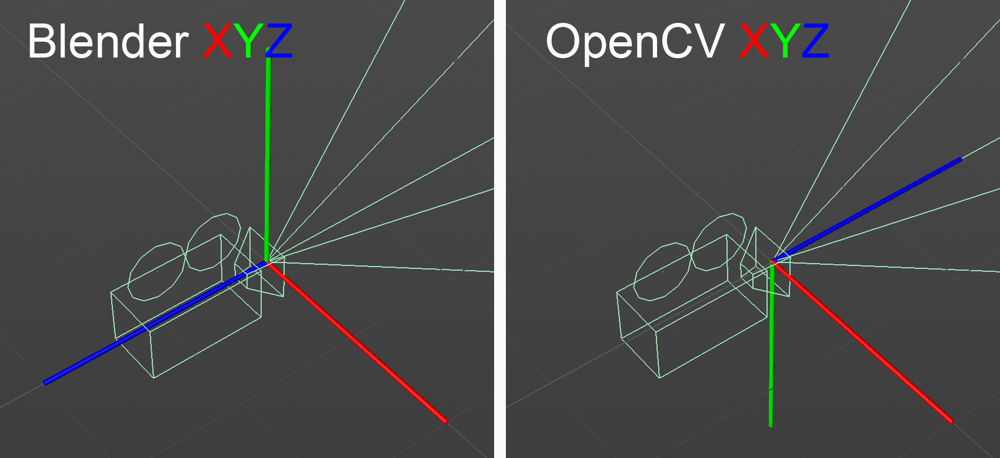

In [24]:
## Convert rvec and tvec to a form that is compatible with blender
def convertTransformsToBlender(rvec, tvec, worldAxisCoordinate):

    # Convert axis from obj point roation relative to camera, to camera pos. relative to obj points.
    R, _ = cv.Rodrigues(rvec)
    R_inv = R.T                 # Transpose is the same as an inversion as R is symmetric

    ## FIND THE TRANSLATION VECTOR
    # Invert the translation vector so the transform represents the camera relative to obj. points instead of obj. points relative to camera
    tvec_inv = -np.dot(R_inv, tvec)

    # Compensate for the real-world coordinates of the ArUco origin in the tvec
    T_adjusted = [tvec_inv[0] + worldAxisCoordinate[0],     # x_blender = x + width_of_gridboard_padding
                  worldAxisCoordinate[1] - tvec_inv[1],     # y_blender = length_of_gridboard_padding - y
                  worldAxisCoordinate[2] - tvec_inv[2]]     # z_blender = height_of_gridboard - z
    T_adjusted = np.array(T_adjusted)

    ## FIND THE ROTATION VECTOR
    # Transform the blender coordinate system to the ArUco Gridboard Coordinate System
    blenderDatumnToGridboardDatumn = np.array([[1,  0,  0], 
                                               [0, -1,  0], 
                                               [0,  0, -1]], dtype=np.float64)
    # Transform the OpenCV camera coordinate system to the Blender camera coordinate system
    openCVCameraDatumnToBlenderCameraDatumn = np.array([[1,  0,  0], 
                                                        [0, -1,  0], 
                                                        [0,  0, -1]], dtype=np.float64)
    # First, transform the blender coordinates to ArUco coordinates, then, apply the inverse rotation to 
    # map the ArUco grid space to the openCV camera space, then finally convert from openCV camera space to 
    # blender camera space
    R_adjusted = openCVCameraDatumnToBlenderCameraDatumn @ R_inv @ blenderDatumnToGridboardDatumn

    # Create a 4x4 transformation matrix with inverted rotation and translation
    blender_matrix = np.zeros((4, 4))
    blender_matrix[:3, :3] = R_adjusted
    blender_matrix[:3, 3] = T_adjusted.flatten()
    blender_matrix[3, 3] = 1.0
    
    # Print the results so they may be imported to blender
    string = "["
    for i in range(blender_matrix.shape[0]):
        
        string = string + "["
        for j in range(blender_matrix.shape[1]):
            if not (i == blender_matrix.shape[0]-1 and j == blender_matrix.shape[1]-1):
                string = string + str(blender_matrix[i,j]) + ","
            else:
                string = string + str(blender_matrix[i,j])
        
        if not i == blender_matrix.shape[0]-1:
            string = string + "],"
        else:
            string = string + "]"

    string = string + "]"
    print(" ")
    print("The blender_matrix is:")
    print(string)
    print(" ")

# Execute the Pipeline

In [25]:
# TEMP - FUNCTION TO READ DISTORTION LOOKUP TABLE FROM CSV
def readLookupTableFromCSV(path):
    values = []
    
    with open(path, "r") as csvFile:
        reader = csv.reader(csvFile, delimiter=",")
        next(reader)
        for row in reader:
            values.append(np.float32(row[0]))

    return np.array(values)
    

 
IMAGE SHAPE
(4032, 3024, 3)
 
Datasets/1-16 Gridboard Manual Capture/Gridboard Index 6 Dataset/cameraProperties_0001.csv
 
CAMERA MATRIX
[[2.7093810e+03 0.0000000e+00 1.5120000e+03]
 [0.0000000e+00 2.7093810e+03 2.0159999e+03]
 [0.0000000e+00 0.0000000e+00 1.0000000e+00]]
 
 
UNRECTIFIED IMAGE


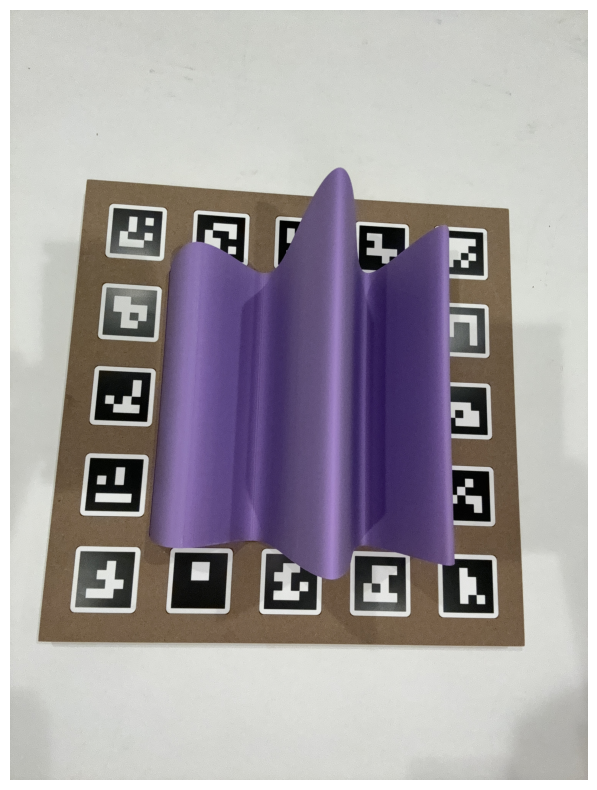

 
3024, 4032
 
RECTIFIED IMAGE


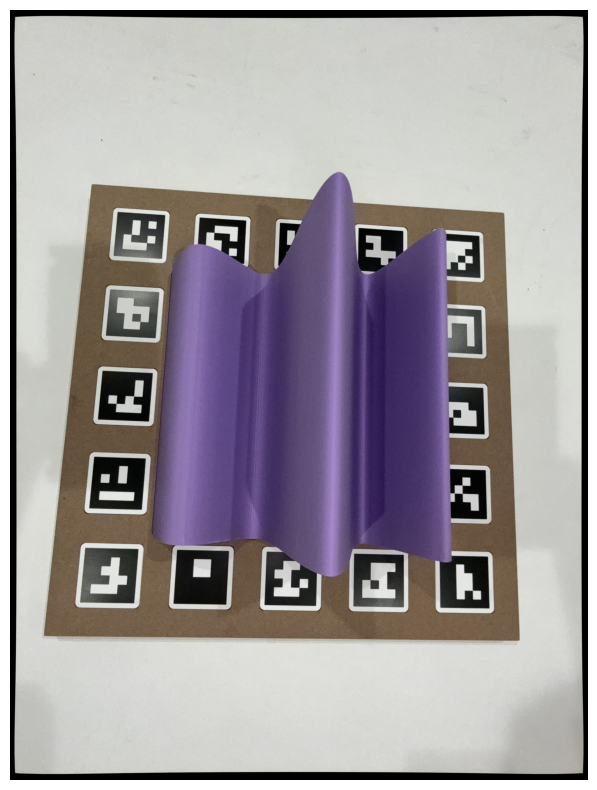

In [39]:
##################################################################################################
## Load image and camera properties
##################################################################################################

# Input file directory
input_dir = r"Datasets/1-16 Gridboard Manual Capture/Gridboard Index 6 Dataset"

# Load image
image_path = sorted(glob(os.path.join(input_dir, "image_0001.png")))[0]
image = cv.imread(image_path)
print(" ")
print("IMAGE SHAPE")
print(image.shape)
print(" ")

# Load camera properties
cameraPropertiesCSV = sorted(glob(os.path.join(input_dir, "cameraProperties_0001.csv")))[0]
print(cameraPropertiesCSV)
cameraProperties = {}

# Open the CSV containing the camera properties
with open(cameraPropertiesCSV, "r") as csvFile:
    reader = csv.reader(csvFile, delimiter=",")
    next(reader)

    # Loop through the rows to isolate the properties
    for row in reader:
        if not row == []:
            # Append the properties to the master dictionary
            property = row[0]
            if not property == 'Device':
                value = float(row[1])
            else: 
                value = row[1]
            cameraProperties[property] = value

# Extract the image parameters: 
fx = cameraProperties['Intrinsic Matrix [FocalX]']
fy = cameraProperties['Intrinsic Matrix [FocalY]']
cx = cameraProperties['Intrinsic Matrix [PrincipalPointX]']
cy = cameraProperties['Intrinsic Matrix [PrincipalPointY]']
dx = cameraProperties['Distortion Center [X]']
dy = cameraProperties['Distortion Center [Y]']
referenceWidth = cameraProperties['Reference Dimensions [Width]']
referenceHeight = cameraProperties['Reference Dimensions [Height]']
pixelsToMMRatio = cameraProperties['Pixel Size']

# Apply parameters to create intrinsic matrix
mtx = np.array([[fy, 0, cy], [0, fx, cx], [0, 0, 1]])
print(" ")
print('CAMERA MATRIX')
print(mtx)
print(" ")

# Rectification is applied to image in subsiquent steps, so this is zero
dist = np.zeros(5)

# Load the distortionLookup table and inverseDistortionLookupTable
inverseLensDistortionLookupTablePath = os.path.join(input_dir, "inverseLensDistortionLookupTable_0001")
lensDistortionLookupTablePath = os.path.join(input_dir, "lensDistortionLookupTable_0001")

# inverseLensDistortionLookupTable = readLookupTableFromCSV(inverseLensDistortionLookupTablePath)
# lensDistortionLookupTable = readLookupTableFromCSV(lensDistortionLookupTablePath)
inverseLensDistortionLookupTable = np.fromfile(inverseLensDistortionLookupTablePath, dtype=np.float32)
lensDistortionLookupTable = np.fromfile(lensDistortionLookupTablePath, dtype=np.float32)

# Rectify the image
print(" ")
print("UNRECTIFIED IMAGE")
plt.rcParams["figure.figsize"] = (10,10)
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()
print(" ")

image = undistortImage(image, lensDistortionLookupTable, Point(dx, dy))
print(" ")
print("RECTIFIED IMAGE")
plt.rcParams["figure.figsize"] = (10,10)
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()
print(" ")

# Load the depth maps
depthmapPaths = sorted(glob(os.path.join(input_dir, "depthMap_*")))

 
GRID PARAMETERS
Grid size: 0.31797337600000003 m
Numer of markers: 5 x 5
Marker seperation: 0.029493344
Grid Ids: [ 4  5  6  7  8  9 20 21 22 10 11 23 24 25 12 13 26 27 28 14 15 17 18 19
 16]
 
Total number of markers detected: 7
[INFO] ArUco marker ID: 15
[INFO] ArUco marker ID: 17
[INFO] ArUco marker ID: 13
[INFO] ArUco marker ID: 19
[INFO] ArUco marker ID: 11
[INFO] ArUco marker ID: 9
[INFO] ArUco marker ID: 4


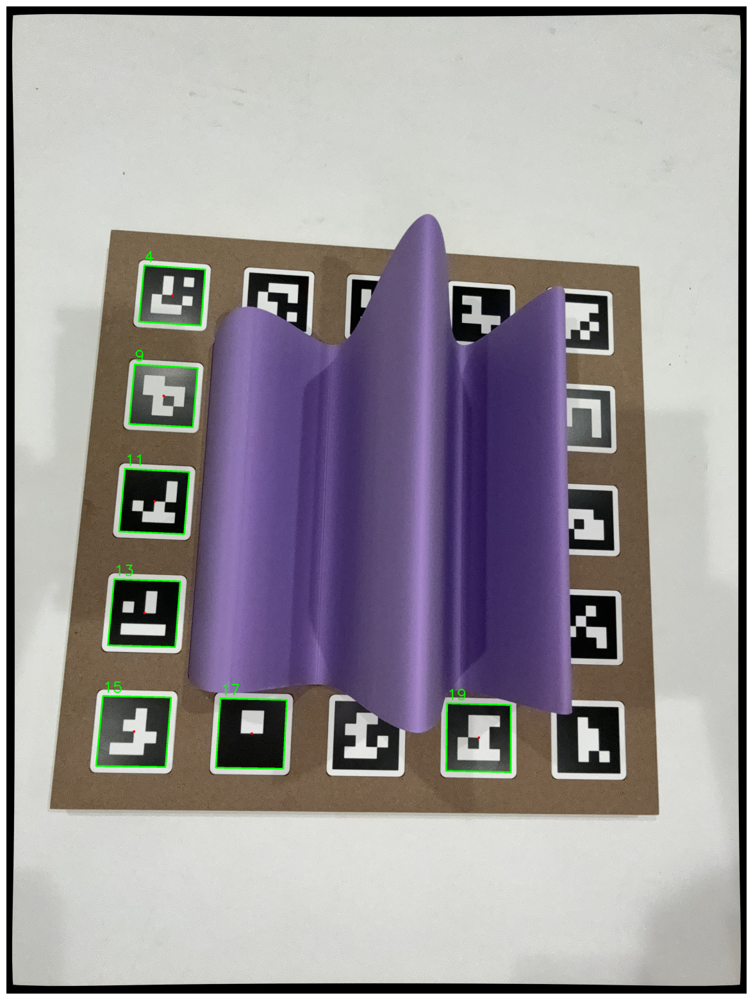

Matched obj points: [[[0.         0.27797335 0.        ]]

 [[0.04       0.27797335 0.        ]]

 [[0.04       0.31797335 0.        ]]

 [[0.         0.31797335 0.        ]]

 [[0.06949334 0.27797335 0.        ]]

 [[0.10949334 0.27797335 0.        ]]

 [[0.10949334 0.31797335 0.        ]]

 [[0.06949334 0.31797335 0.        ]]

 [[0.         0.20848002 0.        ]]

 [[0.04       0.20848002 0.        ]]

 [[0.04       0.24848002 0.        ]]

 [[0.         0.24848002 0.        ]]

 [[0.20848002 0.27797335 0.        ]]

 [[0.24848002 0.27797335 0.        ]]

 [[0.24848002 0.31797335 0.        ]]

 [[0.20848002 0.31797335 0.        ]]

 [[0.         0.13898668 0.        ]]

 [[0.04       0.13898668 0.        ]]

 [[0.04       0.17898667 0.        ]]

 [[0.         0.17898667 0.        ]]

 [[0.         0.06949334 0.        ]]

 [[0.04       0.06949334 0.        ]]

 [[0.04       0.10949334 0.        ]]

 [[0.         0.10949334 0.        ]]

 [[0.         0.         0.        ]]

 [[0.

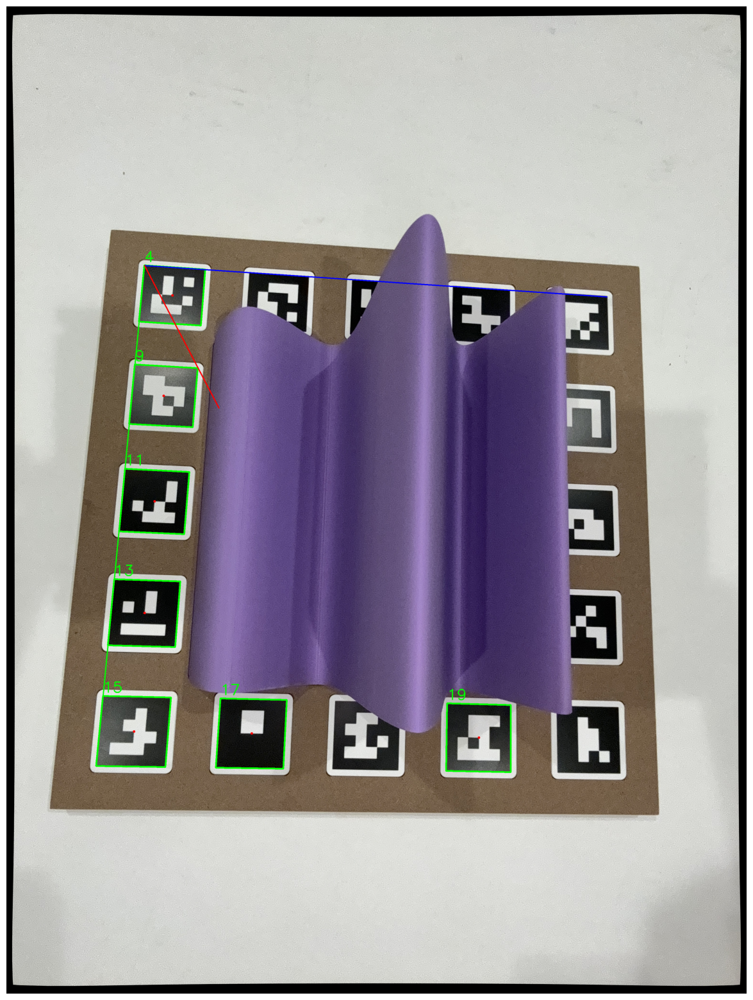

rvec: [[-0.16518517]
 [-0.07517425]
 [ 0.03790625]]
tvec: [[-0.15502841]
 [-0.15675048]
 [ 0.44326541]]
 
The blender_matrix is:
[[0.996466114781819,-0.04388052373681464,-0.07162249456846323,0.15366107218440897,],[0.03149838274749869,0.9856795797192228,-0.16566115419381913,0.11897053701223545,],[0.07786612855355513,0.1628197339425387,0.9835784667544132,0.4288857010264028,],[0.0,0.0,0.0,1.0]]
 


In [59]:
##################################################################################################
## Load the dictionary for which the markers will be based
##################################################################################################

dictionary = cv.aruco.getPredefinedDictionary(cv.aruco.DICT_4X4_50)

parameters = cv.aruco.DetectorParameters()
parameters.polygonalApproxAccuracyRate = 0.003       # default 0.03
parameters.maxErroneousBitsInBorderRate = 0.35       # default 0.35
parameters.minOtsuStdDev = 5.0                      # default 5.0
parameters.errorCorrectionRate = 0.6                # default 0.6
parameters.cornerRefinementMethod = cv.aruco.CORNER_REFINE_APRILTAG

detector = cv.aruco.ArucoDetector(dictionary, parameters)

##################################################################################################
## Generate Gridboard
##################################################################################################

# Real-world origin location (x, y, z from origin to obj point 1 in Fusion 360 coordinates)
ArUcoOriginWorldCoordinates = [0.02405, 0.342025, 0.00635]

# Define the shape of the grid (LASER CUT SETTINGS)
# numberOfTags = 2            # the gridboard will be NxN in shape
# markerLength = 0.040        # size in meters
# markerSeperation = 0.229875 + 2*(0.00005) + 2*(0.004)
# worldGridSize = numberOfTags*markerLength+(numberOfTags-1)*markerSeperation
numberOfTags = 5            # the gridboard will be NxN in shape
markerLength = 0.040        # size in meters
markerSeperation = 0.029493344
worldGridSize = numberOfTags*markerLength+(numberOfTags-1)*markerSeperation
gridIds = np.array([(4,  5,  6,  7,  8), 
                    (9,  20, 21, 22, 10),
                    (11, 23, 24, 25, 12),
                    (13, 26, 27, 28, 14),
                    (15, 17, 18, 19, 16)]).flatten()

# Instantiate the grid
# gridIds = np.linspace(0, numberOfTags**2-1, numberOfTags**2)
gridSize = (numberOfTags, numberOfTags)
grid = cv.aruco.GridBoard(gridSize, markerLength, markerSeperation, dictionary, gridIds)

# Output grid parameters
print(" ")
print("GRID PARAMETERS")
print("Grid size: {} m".format(worldGridSize))
print("Numer of markers: {} x {}".format(numberOfTags, numberOfTags))
print("Marker seperation: {}".format(markerSeperation))
print("Grid Ids: {}".format(gridIds))
print(" ")

##################################################################################################
## Generate ArUco codes and save them as 3D models
##################################################################################################

# # Generate the ArUco markers that are used in the grid
# markerImagePaths = generateArUcoMarkers(numberOfTags**2, dictionary)

# # Convert the image to an STL
# for markerImagePath in markerImagePaths:
#     create_3d_model(markerImagePath, 'testBoard', target_width=worldGridSize, height=1)
#     ## add some way to make a boarder

##################################################################################################
## Detect and Process ArUco codes
##################################################################################################

# Ideal Camera Parameters
# idealFocal = 150.
# idealCenter = gridImageSize/2
# idealMtx = np.array([[idealFocal, 0, idealCenter],[0, idealFocal, idealCenter],[0, 0, 1]])
# idealDist = np.zeros(5)

# Test detection on both the regular, and rotated image
# testGrid = cv.copyMakeBorder(gridImage, 10,10,10,10,cv.BORDER_CONSTANT,value=255)
# testGrid = cv.resize(testGrid, (3024, 3024), interpolation=cv.INTER_AREA)
# testGrid = cv.copyMakeBorder(testGrid, int((4032-3024)/2), int((4032-3024)/2), 0, 0, cv.BORDER_CONSTANT, value=255)
# testGrid = cv.cvtColor(testGrid, cv.COLOR_GRAY2BGR)
rvec, tvec = findTagsInGrid(image, grid, detector, mtx, dist, worldGridSize)

# Print calculated results
print("rvec: {}".format(rvec))
print("tvec: {}".format(tvec))

##################################################################################################
## Output the blender_matrix
##################################################################################################

convertTransformsToBlender(rvec, tvec, ArUcoOriginWorldCoordinates)


 
RECTIFIED IMAGE


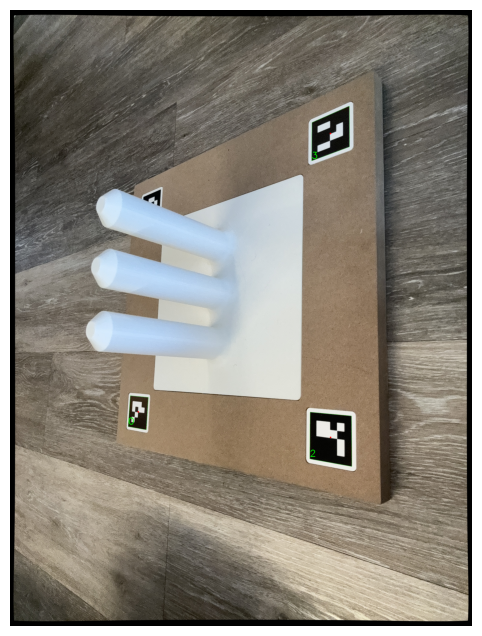

 
 
BLENDER RENDER


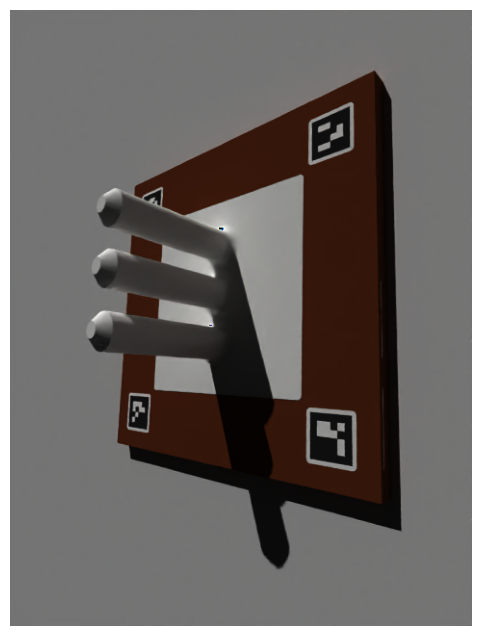

 
 
OVERLAY


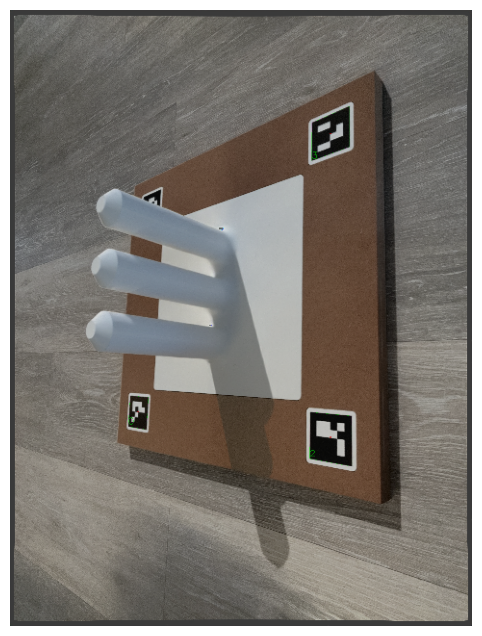

In [ ]:
import OpenEXR
import Imath
import numpy as np

def load_exr(exr_path):
    # Open the EXR file
    exr_file = OpenEXR.InputFile(exr_path)

    # Get the size of the image
    dw = exr_file.header()['dataWindow']
    width, height = dw.max.x - dw.min.x + 1, dw.max.y - dw.min.y + 1

    # Specify the pixel type
    pt = Imath.PixelType(Imath.PixelType.FLOAT)

    # Read the RGB channels
    rgb_str = [exr_file.channel(c, pt) for c in ('R', 'G', 'B')]
    # Convert the strings to NumPy arrays
    rgb_arrays = [np.frombuffer(c, dtype=np.float32) for c in rgb_str]
    # Stack the arrays into a single multi-channel array (height, width, channels)
    rgb_image = np.stack(rgb_arrays, axis=-1).reshape(height, width, 3)

    # Read the depth channel
    depth_str = exr_file.channel('Z', pt)
    # Convert the string to a NumPy array
    depth_array = np.frombuffer(depth_str, dtype=np.float32)
    # Reshape the array to the image dimensions (height, width)
    depth_image = depth_array.reshape(height, width)

    return rgb_image, depth_image

# Path to your EXR file
exr_path = r"iPhone Tests/Experiment_2/rendered_0000.exr"

# Load the EXR file and get the RGB image and depth map as NumPy arrays
blenderImage, blenderDepth = load_exr(exr_path)

# Convert image from float to unit
blenderImage = cv.cvtColor((blenderImage * 255).astype('uint8'), cv.COLOR_BGR2RGB)

# Now, `rgb_data` contains the RGB image, and `depth_data` contains the depth information
overlay = cv.addWeighted(cv.resize(image, (480, 640), interpolation=cv.INTER_LANCZOS4), 0.5, blenderImage, 0.5, 0)
figSize = (8,8)

print(" ")
print("RECTIFIED IMAGE")
plt.rcParams["figure.figsize"] = figSize
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()
print(" ")
print(" ")
print("BLENDER RENDER")
plt.rcParams["figure.figsize"] = figSize
plt.imshow(cv.cvtColor(blenderImage, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()
print(" ")
print(" ")
print("OVERLAY")
plt.rcParams["figure.figsize"] = figSize
plt.imshow(cv.cvtColor(overlay, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()
print(" ")

 
TRUEDEPTH MAP


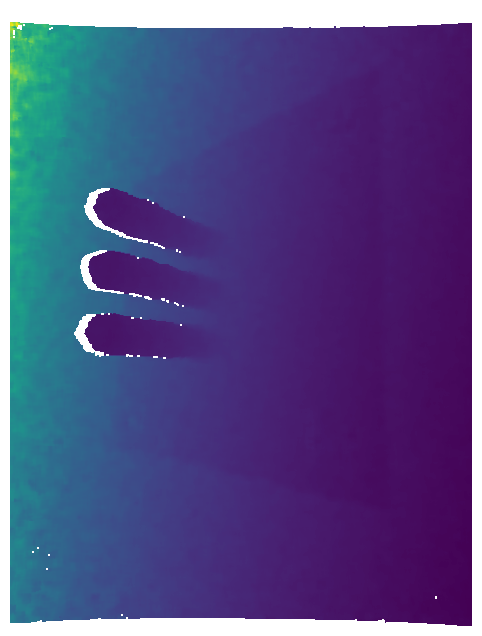

 
 
SYNTHETIC DEPTH MAP


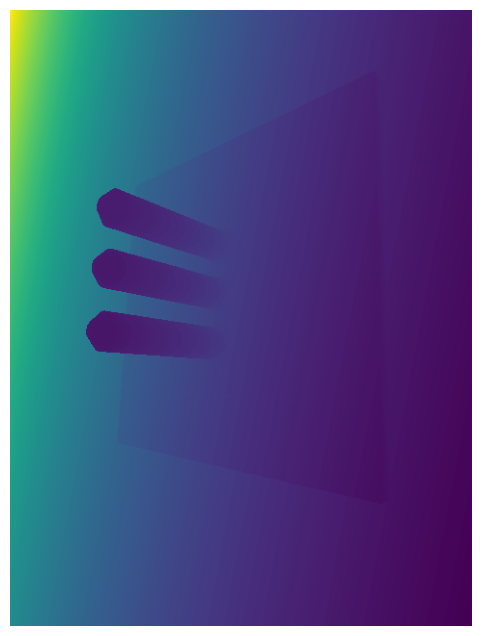

 
 
COMBINED DEPTH MAP


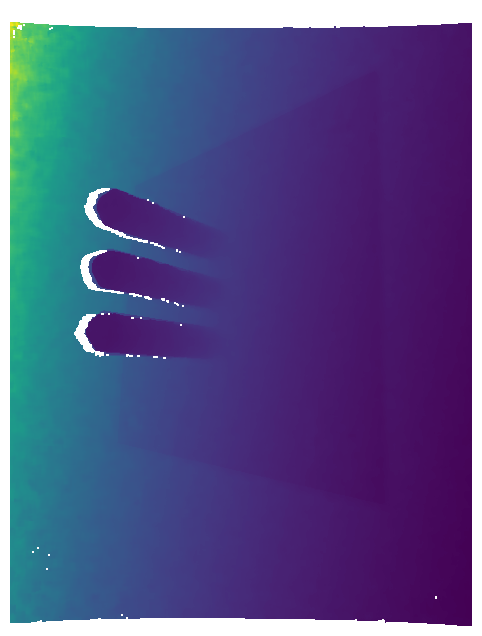

In [ ]:
# Importing TIFF Depth File

import numpy as np
import matplotlib.pyplot as plt

file = r"iPhone Tests/Experiment_2/depthMap_0001_00.tiff"
data_int32 = np.fromfile(file, dtype=np.int32)
data_float32 = np.fromfile(file, dtype=np.float32)
bytesPerRow = int(data_int32[0]/4)
rows = int(data_int32[1])
depthMap = np.reshape(data_float32[2:],(rows,bytesPerRow))

print(" ")
print("TRUEDEPTH MAP")
plt.rcParams["figure.figsize"] = figSize
plt.imshow(cv.rotate(depthMap, cv.ROTATE_90_CLOCKWISE))
plt.axis('off')
plt.show()
print(" ")
print(" ")
print("SYNTHETIC DEPTH MAP")
plt.rcParams["figure.figsize"] = figSize
plt.imshow(blenderDepth)
plt.axis('off')
plt.show()
print(" ")
print(" ")
print("COMBINED DEPTH MAP")
plt.rcParams["figure.figsize"] = figSize
plt.imshow(blenderDepth+cv.rotate(depthMap, cv.ROTATE_90_CLOCKWISE))
plt.axis('off')
plt.show()
print(" ")


In [ ]:
import numpy as np

file = r"/Users/connorpovoledo/Downloads/ICP/iPhone Tests/Validation_1/inverseLensDistortionLookupTable_0001"
file2 = r"/Users/connorpovoledo/Downloads/ICP/iPhone Tests/Validation_1/lensDistortionLookupTable_0001"

inverse = np.fromfile(file, dtype=np.float32)
src = np.fromfile(file2, dtype=np.float32)

print("INVERSE")
for i in inverse:
    print(i)

print(" ")
print("NOT INVERSE")
for i in src:
    print(i)

INVERSE
6.3464518e-06
1.4634361e-05
3.7274353e-05
6.775337e-05
9.5733805e-05
0.00010779637
8.8414396e-05
2.1097538e-05
-0.000110370485
-0.00032068367
-0.00062184205
-0.0010221406
-0.0015253932
-0.0021304504
-0.002831047
-0.0036159921
-0.0044696867
-0.005372925
-0.0063039204
-0.00723947
-0.008156175
-0.009031626
-0.009845468
-0.010580291
-0.011222304
-0.011761794
-0.012193394
-0.012516242
-0.012734114
-0.012855652
-0.012894802
-0.012871488
-0.012812486
-0.012752204
-0.012732806
-0.012802584
-0.0130108725
-0.013396864
-0.013968578
-0.014666764
-0.015306559
-0.015486636
 
NOT INVERSE
-3.650347e-06
-1.214214e-05
-3.5371526e-05
-6.675976e-05
-9.586236e-05
-0.000109112116
-9.078864e-05
-2.4149871e-05
0.00010734815
0.000318822
0.0006228006
0.0010282069
0.001539547
0.002156359
0.0028729578
0.0036785007
0.0045573697
0.005489859
0.006453123
0.0074223382
0.008371996
0.009277249
0.010115221
0.010866203
0.011514656
0.012049984
0.012467069
0.012766588
0.012955184
0.013045568
0.013056662
0.013013839


 
ORIGINAL IMAGE


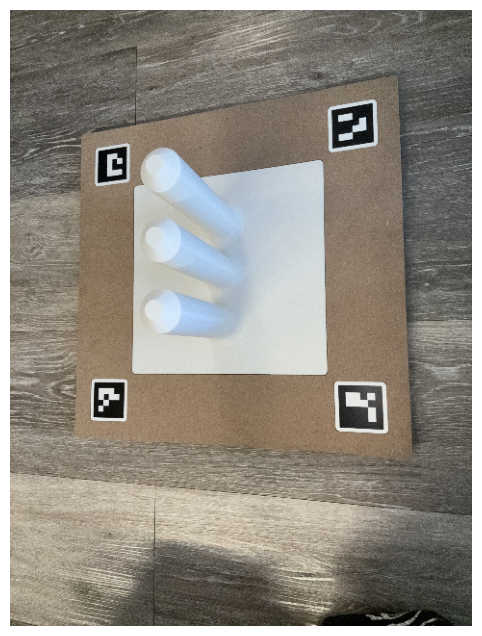

 
 
UNRECTIFIED BLENDER RENDER


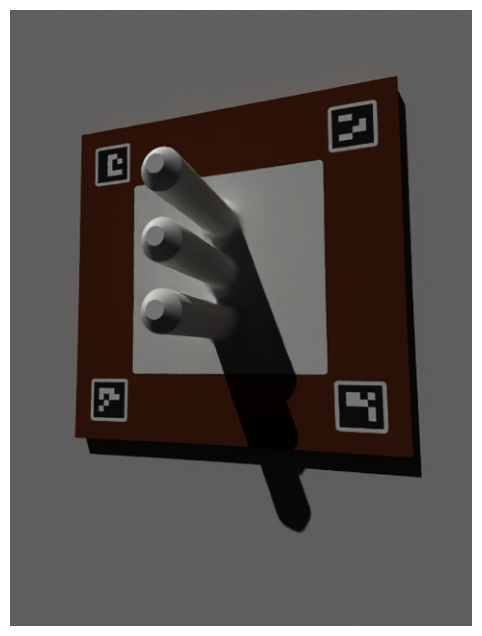

 
 
COMBINED DISTORTED IMAGES


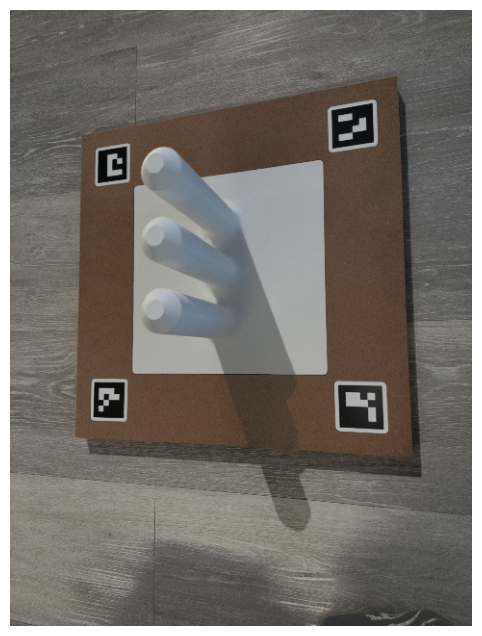

In [ ]:
val_image = cv.imread(r"iPhone Tests/Experiment_2/image_0002.png")
val_synthetic_image = cv.imread(r"iPhone Tests/Experiment_2/synthetic_image_0002.png")

val_image = cv.resize(val_image, (val_synthetic_image.shape[1], val_synthetic_image.shape[0]))

overlay = cv.addWeighted(val_image, 0.5, val_synthetic_image, 0.5, 0)

print(" ")
print("ORIGINAL IMAGE")
plt.rcParams["figure.figsize"] = figSize
plt.imshow(cv.cvtColor(val_image, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()
print(" ")
print(" ")
print("UNRECTIFIED BLENDER RENDER")
plt.rcParams["figure.figsize"] = figSize
plt.imshow(cv.cvtColor(val_synthetic_image, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()
print(" ")
print(" ")
print("COMBINED DISTORTED IMAGES")
plt.rcParams["figure.figsize"] = figSize
plt.imshow(cv.cvtColor(overlay, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()
print(" ")

Grid size: 0.388 m
Numer of markers: 5
Marker seperation: 0.047
Grid Ids: [ 4  5  6  7  8  9 20 21 22 10 11 23 24 25 12 13 26 27 28 14 15 17 18 19
 16]


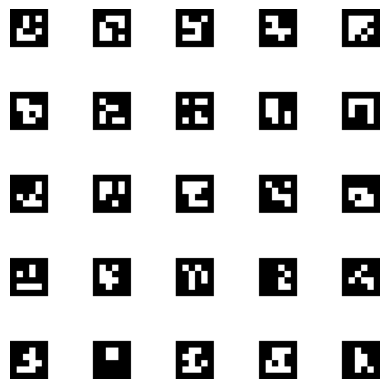

(array([[0.  , 0.  , 0.  ],
       [0.04, 0.  , 0.  ],
       [0.04, 0.04, 0.  ],
       [0.  , 0.04, 0.  ]], dtype=float32), array([[0.087, 0.   , 0.   ],
       [0.127, 0.   , 0.   ],
       [0.127, 0.04 , 0.   ],
       [0.087, 0.04 , 0.   ]], dtype=float32), array([[0.174     , 0.        , 0.        ],
       [0.21399999, 0.        , 0.        ],
       [0.21399999, 0.04      , 0.        ],
       [0.174     , 0.04      , 0.        ]], dtype=float32), array([[0.26099998, 0.        , 0.        ],
       [0.30099997, 0.        , 0.        ],
       [0.30099997, 0.04      , 0.        ],
       [0.26099998, 0.04      , 0.        ]], dtype=float32), array([[0.348     , 0.        , 0.        ],
       [0.38799998, 0.        , 0.        ],
       [0.38799998, 0.04      , 0.        ],
       [0.348     , 0.04      , 0.        ]], dtype=float32), array([[0.   , 0.087, 0.   ],
       [0.04 , 0.087, 0.   ],
       [0.04 , 0.127, 0.   ],
       [0.   , 0.127, 0.   ]], dtype=float32), array([[0

In [ ]:
## Making a gridboard with padded fiducials
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

dictionary = cv.aruco.getPredefinedDictionary(cv.aruco.DICT_4X4_50)
parameters = cv.aruco.DetectorParameters()
detector = cv.aruco.ArucoDetector(dictionary, parameters)

# Define the shape of the grid
worldGridSize = 0.388
numberOfTags = 5
markerLength = 0.040 # size in meters

# Calculate the grid parameters
gridSize = (numberOfTags, numberOfTags)
markerSeperation =  (worldGridSize-markerLength*numberOfTags)/(numberOfTags-1) # seperation in meters
gridIds = np.array([(4,  5,  6,  7,  8), 
                    (9,  20, 21, 22, 10),
                    (11, 23, 24, 25, 12),
                    (13, 26, 27, 28, 14),
                    (15, 17, 18, 19, 16)]).flatten()

# Output grid parameters
print("Grid size: {} m".format(worldGridSize))
print("Numer of markers: {}".format(numberOfTags))
print("Marker seperation: {}".format(markerSeperation))
print("Grid Ids: {}".format(gridIds))

# Instantiate the grid
grid = cv.aruco.GridBoard(gridSize, markerLength, markerSeperation, dictionary, gridIds)

# Display the grid
gridImageSize = 1000
gridImage = np.zeros((gridImageSize,gridImageSize), dtype=np.uint8)
gridImage = grid.generateImage((gridImageSize,gridImageSize), gridImage, 0, 1)
plt.imshow(gridImage, cmap='gray')
plt.axis('off')
plt.show()

# Print the grid properties
print(grid.getObjPoints())